<a href="https://colab.research.google.com/github/oneraghavan/machine-learning-implementations/blob/master/notebooks/Pneumothorax.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import fastai
print(fastai.__version__)

1.0.53.post2


In [0]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
!cp gdrive/My\ Drive/dicom*.zip .
!cp gdrive/My\ Drive/train-rle.csv .

In [0]:
!unzip dicom-images-test.zip
!unzip dicom-images-train.zip

Archive:  dicom-images-test.zip
   creating: dicom-images-test/
   creating: dicom-images-test/1.2.276.0.7230010.3.1.2.8323329.5797.1517875190.762693/
   creating: dicom-images-test/1.2.276.0.7230010.3.1.2.8323329.5797.1517875190.762693/1.2.276.0.7230010.3.1.3.8323329.5797.1517875190.762692/
  inflating: dicom-images-test/1.2.276.0.7230010.3.1.2.8323329.5797.1517875190.762693/1.2.276.0.7230010.3.1.3.8323329.5797.1517875190.762692/1.2.276.0.7230010.3.1.4.8323329.5797.1517875190.762694.dcm  
   creating: dicom-images-test/1.2.276.0.7230010.3.1.2.8323329.5798.1517875190.796715/
   creating: dicom-images-test/1.2.276.0.7230010.3.1.2.8323329.5798.1517875190.796715/1.2.276.0.7230010.3.1.3.8323329.5798.1517875190.796714/
  inflating: dicom-images-test/1.2.276.0.7230010.3.1.2.8323329.5798.1517875190.796715/1.2.276.0.7230010.3.1.3.8323329.5798.1517875190.796714/1.2.276.0.7230010.3.1.4.8323329.5798.1517875190.796716.dcm  
   creating: dicom-images-test/1.2.276.0.7230010.3.1.2.8323329.5799.151787

In [0]:
!head -10 train-rle.csv

ImageId, EncodedPixels
1.2.276.0.7230010.3.1.4.8323329.5597.1517875188.959090, -1
1.2.276.0.7230010.3.1.4.8323329.12515.1517875239.501137, -1
1.2.276.0.7230010.3.1.4.8323329.4904.1517875185.355709, 175349 7 1013 12 1009 17 1005 19 1003 20 1002 22 1001 22 1000 23 1000 23 1000 23 999 24 999 23 1000 23 999 23 1000 22 1001 21 1001 22 1001 21 1002 21 1001 22 1001 21 1002 21 1001 22 1001 21 1002 21 1001 22 1001 21 1002 21 1002 21 1002 20 1003 20 1002 21 1001 23 1000 23 999 24 999 24 999 23 999 24 999 24 998 26 996 27 995 28 995 28 994 30 993 30 993 30 993 30 993 31 992 31 992 31 992 31 992 32 990 33 990 33 990 33 991 31 992 31 992 31 992 31 992 31 992 31 992 31 992 31 992 31 992 31 992 31 993 30 993 30 993 30 993 30 994 29 994 29 994 30 993 30 994 29 994 30 993 30 993 31 993 31 992 31 992 31 992 32 992 31 992 31 992 31 992 32 992 31 992 31 992 31 992 32 992 31 992 31 992 31 992 32 992 31 992 31 992 31 992 32 992 31 992 31 992 32 992 31 992 32 992 32 991 32 992 31 992 32 991 32 992 31 992 32 

In [0]:
!ls dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.10000.1517875220.938529/

1.2.276.0.7230010.3.1.3.8323329.10000.1517875220.938528


In [0]:
import pandas as pd

tr_rle = pd.read_csv('train-rle.csv')
print(tr_rle.shape)
tr_rle.head()

(11582, 2)


,ImageId,EncodedPixels
0,1.2.276.0.7230010.3.1.4.8323329.5597.151787518...,-1
1,1.2.276.0.7230010.3.1.4.8323329.12515.15178752...,-1
2,1.2.276.0.7230010.3.1.4.8323329.4904.151787518...,175349 7 1013 12 1009 17 1005 19 1003 20 1002...
3,1.2.276.0.7230010.3.1.4.8323329.32579.15178751...,407576 2 1021 7 1015 10 1013 12 1011 14 1008 ...
4,1.2.276.0.7230010.3.1.4.8323329.32579.15178751...,252069 1 1021 3 1020 4 1018 5 1018 6 1016 7 1...


In [0]:
print('{} unique ImageId'.format(tr_rle.ImageId.nunique()))
tmp = tr_rle.groupby('ImageId').agg({'ImageId':['count']}).reset_index()
tmp.columns = ['ImageId', 'count']
id_multi = tmp.loc[tmp['count'] > 1, 'ImageId']
tr_rle[tr_rle['ImageId'].isin(id_multi)].head(10)

10675 unique ImageId


,ImageId,EncodedPixels
3,1.2.276.0.7230010.3.1.4.8323329.32579.15178751...,407576 2 1021 7 1015 10 1013 12 1011 14 1008 ...
4,1.2.276.0.7230010.3.1.4.8323329.32579.15178751...,252069 1 1021 3 1020 4 1018 5 1018 6 1016 7 1...
5,1.2.276.0.7230010.3.1.4.8323329.32579.15178751...,162376 12 1007 18 1003 22 999 26 996 28 993 3...
6,1.2.276.0.7230010.3.1.4.8323329.32579.15178751...,177708 1 1020 4 1018 5 1016 8 1013 11 1010 13...
19,1.2.276.0.7230010.3.1.4.8323329.3604.151787517...,218560 13 16 1 987 41 979 49 970 64 956 74 94...
20,1.2.276.0.7230010.3.1.4.8323329.3604.151787517...,184910 8 1013 13 1009 15 1007 17 1006 17 1004...
23,1.2.276.0.7230010.3.1.4.8323329.32620.15178751...,630937 2 1020 4 1019 6 1017 7 1017 7 1016 8 1...
24,1.2.276.0.7230010.3.1.4.8323329.32620.15178751...,274585 2 1020 4 1019 5 1018 6 1017 7 1016 8 1...
25,1.2.276.0.7230010.3.1.4.8323329.32620.15178751...,637076 1 1023 1 1022 2 1022 2 1021 3 1021 3 1...
26,1.2.276.0.7230010.3.1.4.8323329.1187.151787516...,223615 6 1008 23 994 35 986 42 979 45 975 49 ...


In [0]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from PIL import Image
import os
import torch
import copy
import torch.utils.data
import matplotlib.patches as patches
from torchvision import transforms
import collections
import random
from tqdm import tqdm_notebook as tqdm


In [0]:
def rle2mask(rle, width, height):
    mask= np.zeros(width* height)
    array = np.asarray([int(x) for x in rle.split()])
    starts = array[0::2]
    lengths = array[1::2]
    current_position = 0
    for index, start in enumerate(starts):
        current_position += start
        mask[current_position:current_position+lengths[index]] = 1
        current_position += lengths[index]
    return mask.reshape(width, height)

In [0]:
import glob
import pydicom
def show_dcm_info(dataset):
    print("Filename.........:", file_path)
    print("Storage type.....:", dataset.SOPClassUID)
    print()

    pat_name = dataset.PatientName
    display_name = pat_name.family_name + ", " + pat_name.given_name
    print("Patient's name......:", display_name)
    print("Patient id..........:", dataset.PatientID)
    print("Patient's Age.......:", dataset.PatientAge)
    print("Patient's Sex.......:", dataset.PatientSex)
    print("Modality............:", dataset.Modality)
    print("Body Part Examined..:", dataset.BodyPartExamined)
    print("View Position.......:", dataset.ViewPosition)
    
    if 'PixelData' in dataset:
        rows = int(dataset.Rows)
        cols = int(dataset.Columns)
        print("Image size.......: {rows:d} x {cols:d}, {size:d} bytes".format(
            rows=rows, cols=cols, size=len(dataset.PixelData)))
        if 'PixelSpacing' in dataset:
            print("Pixel spacing....:", dataset.PixelSpacing)

def plot_pixel_array(dataset, figsize=(10,10)):
    plt.figure(figsize=figsize)
    plt.imshow(dataset.pixel_array, cmap=plt.cm.bone)
    plt.show()

dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.3536.1517875178.281517/1.2.276.0.7230010.3.1.3.8323329.3536.1517875178.281516/1.2.276.0.7230010.3.1.4.8323329.3536.1517875178.281518.dcm
Filename.........: dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.3536.1517875178.281517/1.2.276.0.7230010.3.1.3.8323329.3536.1517875178.281516/1.2.276.0.7230010.3.1.4.8323329.3536.1517875178.281518.dcm
Storage type.....: 1.2.840.10008.5.1.4.1.1.7

Patient's name......: a89cd7ce-0dc0-428a-8c79-5b67951af5dd, 
Patient id..........: a89cd7ce-0dc0-428a-8c79-5b67951af5dd
Patient's Age.......: 43
Patient's Sex.......: F
Modality............: CR
Body Part Examined..: CHEST
View Position.......: PA
Image size.......: 1024 x 1024, 109446 bytes
Pixel spacing....: ['0.168', '0.168']


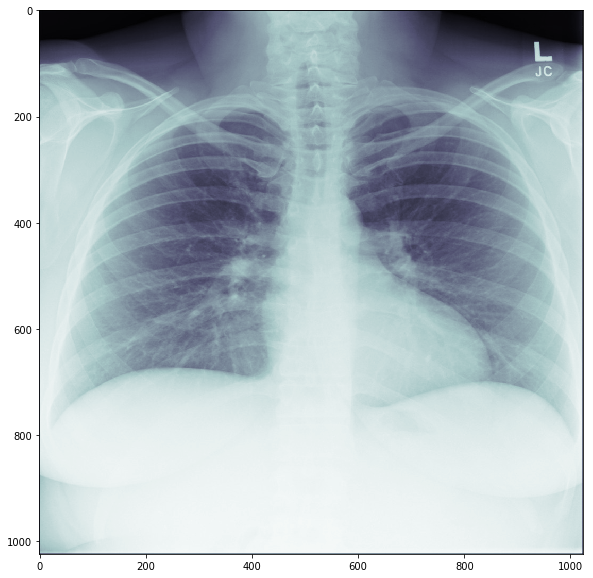

In [0]:
for file_path in glob.glob('dicom-images-train/*/*/*.dcm'):
    print(file_path)
    dataset = pydicom.dcmread(file_path)
    show_dcm_info(dataset)
    plot_pixel_array(dataset)
    break # Comment this out to see all

In [0]:
ls dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.3536.1517875178.281517/1.2.276.0.7230010.3.1.3.8323329.3536.1517875178.281516/

1.2.276.0.7230010.3.1.4.8323329.3536.1517875178.281518.dcm


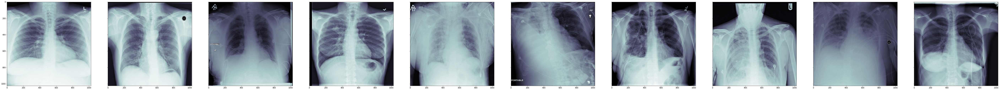

In [0]:
num_img = len(glob.glob('dicom-images-train/*/*/*.dcm')[:10])
fig, ax = plt.subplots(nrows=1, ncols=num_img, sharey=True, figsize=(num_img*10,10))
for q, file_path in enumerate(glob.glob('dicom-images-train/*/*/*.dcm')[:10]):
    dataset = pydicom.dcmread(file_path)
    #show_dcm_info(dataset)
    
    ax[q].imshow(dataset.pixel_array, cmap=plt.cm.bone)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  """Entry point for launching an IPython kernel.


1.2.276.0.7230010.3.1.4.8323329.3536.1517875178.281518
-1
1.2.276.0.7230010.3.1.4.8323329.13790.1517875247.952828
-1
1.2.276.0.7230010.3.1.4.8323329.32152.1517875158.709020
-1
1.2.276.0.7230010.3.1.4.8323329.13679.1517875247.181663
-1
1.2.276.0.7230010.3.1.4.8323329.4126.1517875181.236991
-1
1.2.276.0.7230010.3.1.4.8323329.12641.1517875240.930804
-1
1.2.276.0.7230010.3.1.4.8323329.3039.1517875175.763794
ImageId
1.2.276.0.7230010.3.1.4.8323329.3039.1517875175.763794    212197 2 1017 8 1012 13 1008 17 1005 19 1003 2...
1.2.276.0.7230010.3.1.4.8323329.3039.1517875175.763794    160127 4 1020 19 1004 34 990 49 975 63 960 79 ...
Name: EncodedPixels, dtype: object
['212197 2 1017 8 1012 13 1008 17 1005 19 1003 20 1002 22 1000 24 999 24 998 26 996 27 995 29 994 29 993 31 992 31 992 32 990 34 989 34 988 36 986 37 986 38 984 40 983 40 983 41 981 42 981 43 980 43 979 45 978 45 978 46 976 48 975 48 975 49 974 50 973 51 972 51 972 52 970 54 969 55 968 56 966 57 966 58 965 59 965 59 964 59 964 60 96

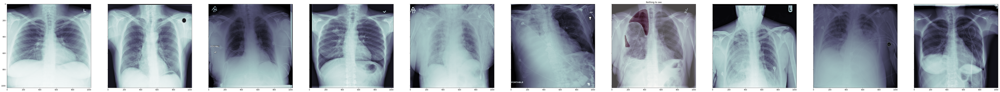

In [0]:
df = pd.read_csv('train-rle.csv',sep=", ",index_col="ImageId")

fig, ax = plt.subplots(nrows=1, ncols=num_img, sharey=True, figsize=(num_img*10,10))
for q, file_path in enumerate(glob.glob('dicom-images-train/*/*/*.dcm')[:10]):
    dataset = pydicom.dcmread(file_path)
    ax[q].imshow(dataset.pixel_array, cmap=plt.cm.bone)
    print(file_path.split('/')[-1][:-4])
    print(df.loc[file_path.split('/')[-1][:-4],'EncodedPixels'])
#     print(type(df.loc[file_path.split('/')[-1][:-4],'EncodedPixels'].strip()))
    if type(df.loc[file_path.split('/')[-1][:-4],'EncodedPixels']).__name__ == "str":
        if df.loc[file_path.split('/')[-1][:-4],'EncodedPixels'] != "-1":
          mask = rle2mask(df.loc[file_path.split('/')[-1][:-4],1], 1024, 1024).T
          ax[q].set_title('See Marker')
          ax[q].imshow(mask, alpha=0.3, cmap="Reds")
          print("single mask")
    else:  
          rles = df.loc[file_path.split('/')[-1][:-4],'EncodedPixels'].values.tolist()          
          masks = []
          print(rles)
          print(type(rles))
          print(len(rles))
          for rle in rles:
            mask = rle2mask(rle, 1024, 1024).T
            masks.append(mask)
          mask = sum(masks)  
          ax[q].set_title('See Marker')
          ax[q].imshow(mask, alpha=0.3, cmap="Reds")
          print("multi mask")
          ax[q].set_title('Nothing to see')

In [0]:
a = df.loc["1.2.276.0.7230010.3.1.4.8323329.1187.1517875166.691986","EncodedPixels"]

In [0]:
a.values.tolist()

['223615 6 1008 23 994 35 986 42 979 45 975 49 972 51 970 53 967 56 963 60 958 66 955 68 954 70 952 72 949 74 948 75 945 77 943 80 940 83 937 86 934 89 933 90 932 92 931 92 930 93 930 93 928 94 928 94 927 96 925 97 925 97 925 98 925 97 925 98 925 98 924 99 923 99 924 99 923 99 924 99 923 99 924 98 925 97 926 97 926 97 926 96 927 96 926 96 927 95 928 95 928 94 928 95 928 94 929 94 929 94 929 94 930 93 930 93 930 93 930 93 930 93 930 93 931 92 931 92 931 92 930 93 930 93 930 93 930 93 929 93 930 93 930 93 929 94 929 94 929 94 929 94 929 94 928 95 928 95 927 96 927 96 927 95 928 95 928 96 927 96 927 96 926 98 925 98 924 100 923 100 923 100 923 101 922 101 922 102 921 102 921 102 921 103 920 103 920 103 920 103 920 103 920 103 920 103 920 103 920 103 921 102 921 102 921 102 921 102 921 102 920 103 920 103 920 104 920 103 920 103 920 103 921 102 921 102 921 102 921 102 921 102 921 101 922 101 922 101 923 101 922 101 922 102 922 101 922 101 923 101 922 101 923 100 923 100 924 100 923 100 923

In [0]:
df.dtypes

ImageId          object
EncodedPixels    object
dtype: object

In [0]:
df

,EncodedPixels
ImageId,
1.2.276.0.7230010.3.1.4.8323329.5597.1517875188.959090,-1
1.2.276.0.7230010.3.1.4.8323329.12515.1517875239.501137,-1
1.2.276.0.7230010.3.1.4.8323329.4904.1517875185.355709,175349 7 1013 12 1009 17 1005 19 1003 20 1002 ...
1.2.276.0.7230010.3.1.4.8323329.32579.1517875161.299312,407576 2 1021 7 1015 10 1013 12 1011 14 1008 1...
1.2.276.0.7230010.3.1.4.8323329.32579.1517875161.299312,252069 1 1021 3 1020 4 1018 5 1018 6 1016 7 10...
1.2.276.0.7230010.3.1.4.8323329.32579.1517875161.299312,162376 12 1007 18 1003 22 999 26 996 28 993 30...
1.2.276.0.7230010.3.1.4.8323329.32579.1517875161.299312,177708 1 1020 4 1018 5 1016 8 1013 11 1010 13 ...
1.2.276.0.7230010.3.1.4.8323329.1314.1517875167.222290,119331 47 972 82 937 107 912 122 897 137 882 1...
1.2.276.0.7230010.3.1.4.8323329.11364.1517875232.606684,-1
